In [1]:
# import scripts.control_utils as cu
from importlib import reload
import matplotlib.pyplot as plt
from annotator.midas import MidasDetector
from annotator.canny import CannyDetector
from ldm.data.util import resize_image_pil
import torch
import torchvision.transforms as tt
import numpy as np

from PIL import Image
# reload(cu)
from safetensors.torch import save_file

torch.cuda.set_device('cuda:6')



In [3]:
import scripts.control_utils as cu
reload(cu)
import os

/export/home/ffeiden/miniconda3/envs/.pt13/lib/python3.8/site-packages/timm/models/_factory.py:114: UserWarning: Mapping deprecated model name vit_base_resnet50_384 to current vit_base_r50_s16_384.orig_in21k_ft_in1k.
  model = create_fn(


# SD 2.1

In [52]:
# model checkpoints
config_path_depth = '/export/home/ffeiden/Projects/ControlNet-XS/configs/inference/sd/sd21_encD_depth_14m.yaml'
model = cu.create_model(config_path_depth)

# config_path_edges = '/export/home/ffeiden/Projects/ControlNet-XS/configs/inference/sd/sd21_encD_canny_14m.yaml'
# model = cu.create_model(config_path_edges)

model = model.to('cuda')

TwoStreamControlLDM: Running in eps-prediction mode
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is None and using 5 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is 1024 and using 5 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is None and using 5 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is 1024 and using 5 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is None and using 10 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is 1024 and using 10 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is None and using 10 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is 1024 and using 10 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 1280, context_dim is None and using 20 heads.
Setting up MemoryEfficientCrossAttention. Query dim

/export/home/ffeiden/miniconda3/envs/.pt13/lib/python3.8/site-packages/timm/models/_factory.py:114: UserWarning: Mapping deprecated model name vit_base_resnet50_384 to current vit_base_r50_s16_384.orig_in21k_ft_in1k.
  model = create_fn(


Loaded model config from [/export/home/ffeiden/Projects/ControlNet-XS/configs/inference/sd/sd21_encD_depth_14m.yaml]


In [54]:
size = 512
num_samples = 2
image_root = '/export/data/ffeiden/Kritische_Szenarien/'
paths = [os.path.join(image_root, path) for path in os.listdir(image_root)]

image_path = paths[1]

canny_high_th = 100
canny_low_th = 100

image = cu.get_image(image_path, size=size)
edges = cu.get_canny_edges(image, low_th=canny_low_th, high_th=canny_high_th)
depth = cu.get_midas_depth(image, max_resolution=size)

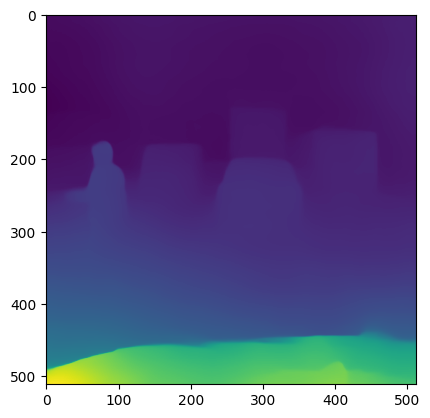

In [64]:
plt.imshow(depth)

Global seed set to 1996


[CONTROL CORRECTION OF TwoStreamControlLDM SCALED WITH 0.85]
Data shape for DDIM sampling is (6, 4, 64, 64), eta 0.5
Running DDIM Sampling with 50 timesteps


DDIM Sampler: 100%|██████████| 50/50 [00:20<00:00,  2.45it/s]


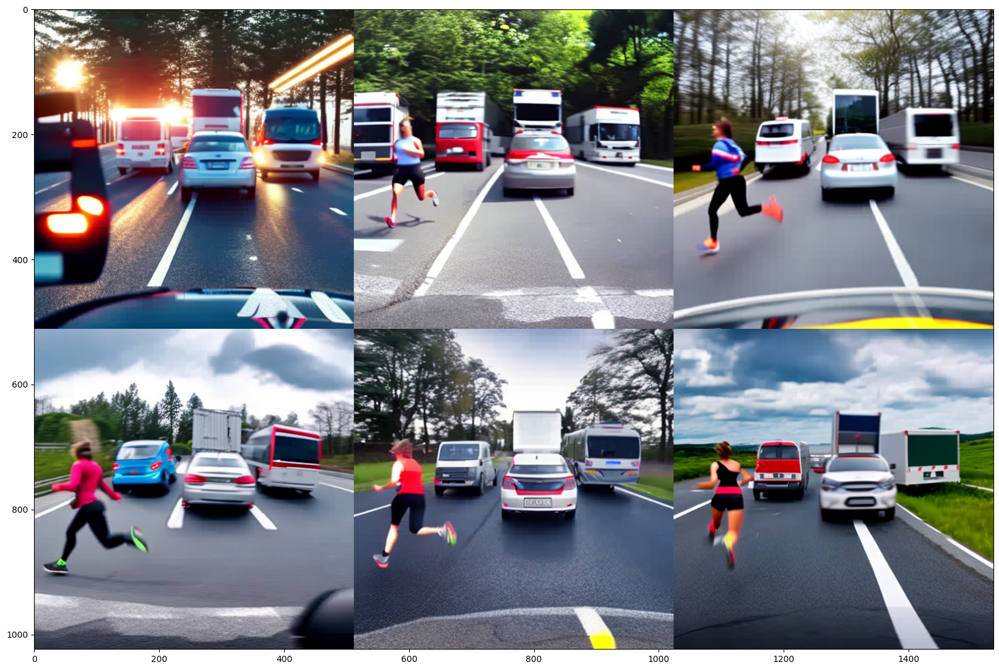

In [70]:
reload(cu)

samples, controls = cu.get_sd_sample(
    guidance=depth,
    ddim_steps=50,
    num_samples=6,
    model=model,
    shape=[4, size // 8, size // 8],
    control_scale=.85,
    prompt='dashcam footage of a woman running across the street. Highly detailed, 4k image, movie, dashcam',
    seed=1996,
)
plt.figure(figsize=(20, 20))
plt.imshow(cu.create_image_grid(samples))

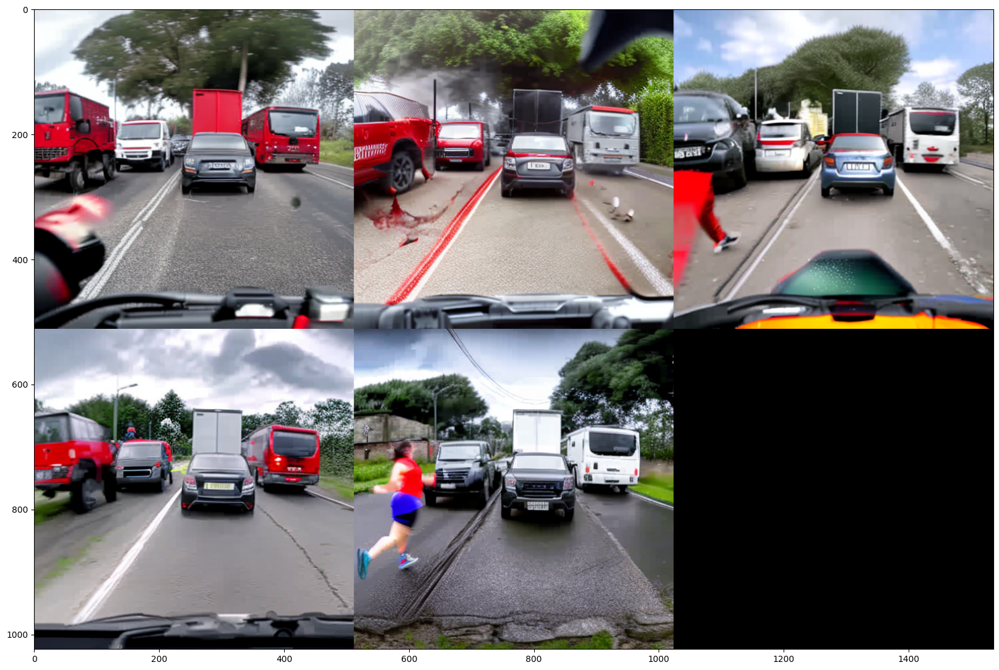

In [48]:
plt.figure(figsize=(20, 20))
plt.imshow(cu.create_image_grid(samples))

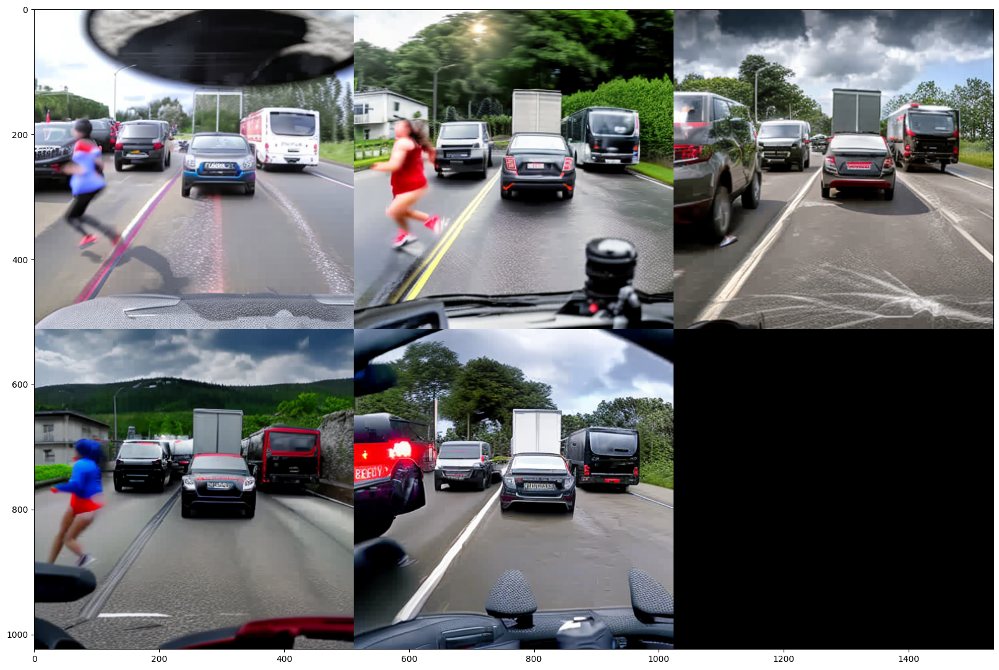

In [ ]:
plt.figure(figsize=(20, 20))
plt.imshow(cu.create_image_grid(samples))

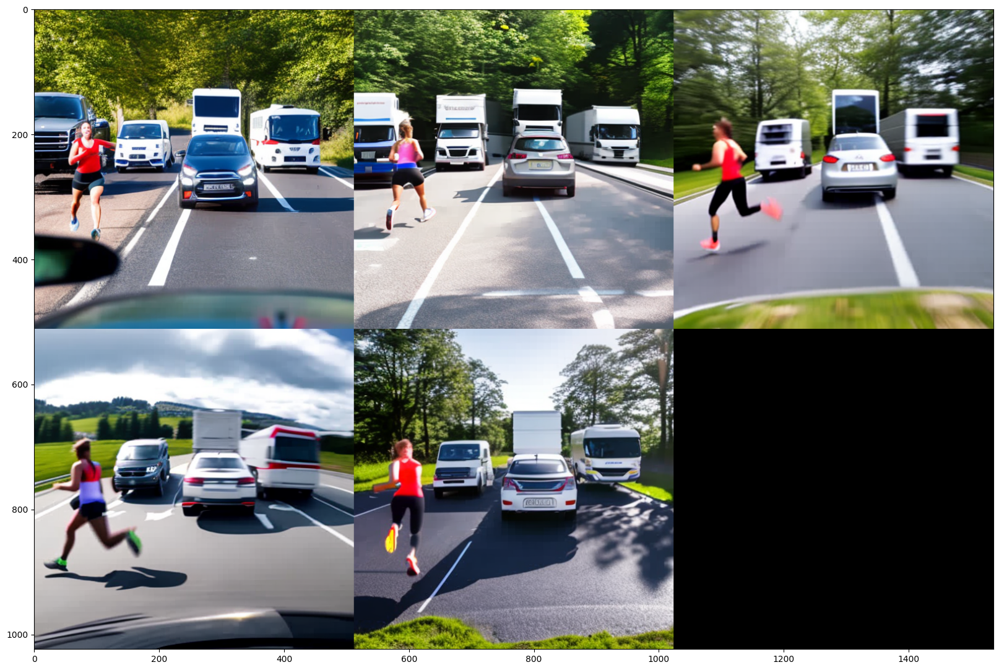

In [58]:
plt.figure(figsize=(20, 20))
plt.imshow(cu.create_image_grid(samples))

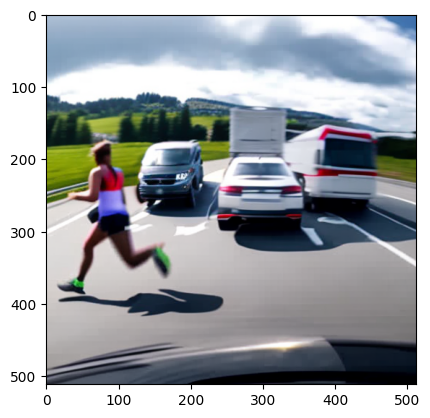

In [61]:
sampe_name = 'Generation_0'
good = samples[3]


plt.imshow(good)
plt.show()

to_save = Image.fromarray(good)
to_save.save('/export/data/ffeiden/Kritische_Szenarien/Generations/'+sampe_name+'.png')


In [ ]:
/export/data/vislearn/rother_subgroup/dzavadsk/models/pretrained_originals/SDXL/sd_xl_base_1.0_0.9vae.safetensors

# SDXL

In [171]:
# config_path_depth = '/export/home/ffeiden/Projects/ControlNet-XS/configs/inference/sdxl/sdxl_encD_depth_48m.yaml'
# model = cu.create_model(config_path_depth)

config_path_edges = '/export/home/ffeiden/Projects/ControlNet-XS/configs/inference/sdxl/sdxl_encD_canny_48m.yaml'
model = cu.create_model(config_path_edges)

model = model.to('cuda')

Building a Downsample layer with 2 dims.
  --> settings are: 
 in-chn: 320, out-chn: 320, kernel-size: 3, stride: 2, padding: 1
constructing SpatialTransformer of depth 2 w/ 640 channels and 10 heads
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is None and using 10 heads with a dimension of 64.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is 2048 and using 10 heads with a dimension of 64.
BasicTransformerBlock is using checkpointing
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is None and using 10 heads with a dimension of 64.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is 2048 and using 10 heads with a dimension of 64.
BasicTransformerBlock is using checkpointing
constructing SpatialTransformer of depth 2 w/ 640 channels and 10 heads
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is None and using 10 heads with a dimension of 64.
Setting up MemoryEffici

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.15.self_attn.k_proj.bias', 'vision_model.encoder.layers.12.self_attn.out_proj.bias', 'vision_model.encoder.layers.22.mlp.fc2.bias', 'vision_model.encoder.layers.11.mlp.fc2.weight', 'vision_model.encoder.layers.23.self_attn.q_proj.bias', 'vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.9.self_attn.v_proj.weight', 'vision_model.encoder.layers.18.self_attn.q_proj.bias', 'vision_model.encoder.layers.17.self_attn.k_proj.weight', 'vision_model.encoder.layers.1.self_attn.k_proj.weight', 'vision_model.encoder.layers.9.mlp.fc2.weight', 'vision_model.encoder.layers.3.mlp.fc2.bias', 'vision_model.encoder.layers.12.self_attn.q_proj.weight', 'vision_model.encoder.layers.20.self_attn.k_proj.weight', 'vision_model.encoder.layers.22.mlp.fc2.weight', 'vision_model.encoder.layers.0.mlp.fc1.bias', 'vision_model.encoder.layers.21.self

Initialized embedder #0: FrozenCLIPEmbedder with 123060480 params. Trainable: False
Initialized embedder #1: FrozenOpenCLIPEmbedder2 with 694659841 params. Trainable: False
Initialized embedder #2: ConcatTimestepEmbedderND with 0 params. Trainable: False
Initialized embedder #3: ConcatTimestepEmbedderND with 0 params. Trainable: False
Initialized embedder #4: ConcatTimestepEmbedderND with 0 params. Trainable: False
making attention of type 'vanilla-xformers' with 512 in_channels
building MemoryEfficientAttnBlock with 512 in_channels...
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla-xformers' with 512 in_channels
building MemoryEfficientAttnBlock with 512 in_channels...
Loaded model config from [/export/home/ffeiden/Projects/ControlNet-XS/configs/inference/sdxl/sdxl_encD_canny_48m.yaml]


In [177]:
# data loading

size = 512
image_root = '/export/data/ffeiden/Kritische_Szenarien/'
paths = [os.path.join(image_root, path) for path in os.listdir(image_root)]

image_path = paths[0]

canny_high_th = 250
canny_low_th = 100

image = cu.get_image(image_path, size=size)
edges = cu.get_canny_edges(image, low_th=canny_low_th, high_th=canny_high_th)
depth = cu.get_midas_depth(image, max_resolution=size)

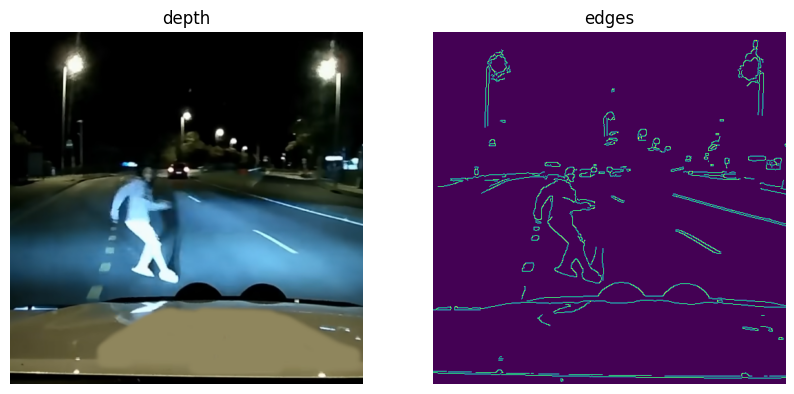

In [178]:
plt.figure(figsize=(10, 10))


plt.subplot(121)
plt.title('depth')
plt.imshow(image)
plt.axis('off')

plt.subplot(122)
plt.title('edges')
plt.imshow(edges)
plt.axis('off')
plt.show()

Global seed set to 1456


[CONTROL CORRECTION OF ControlledDiffusionEngine SCALED WITH 0.95]


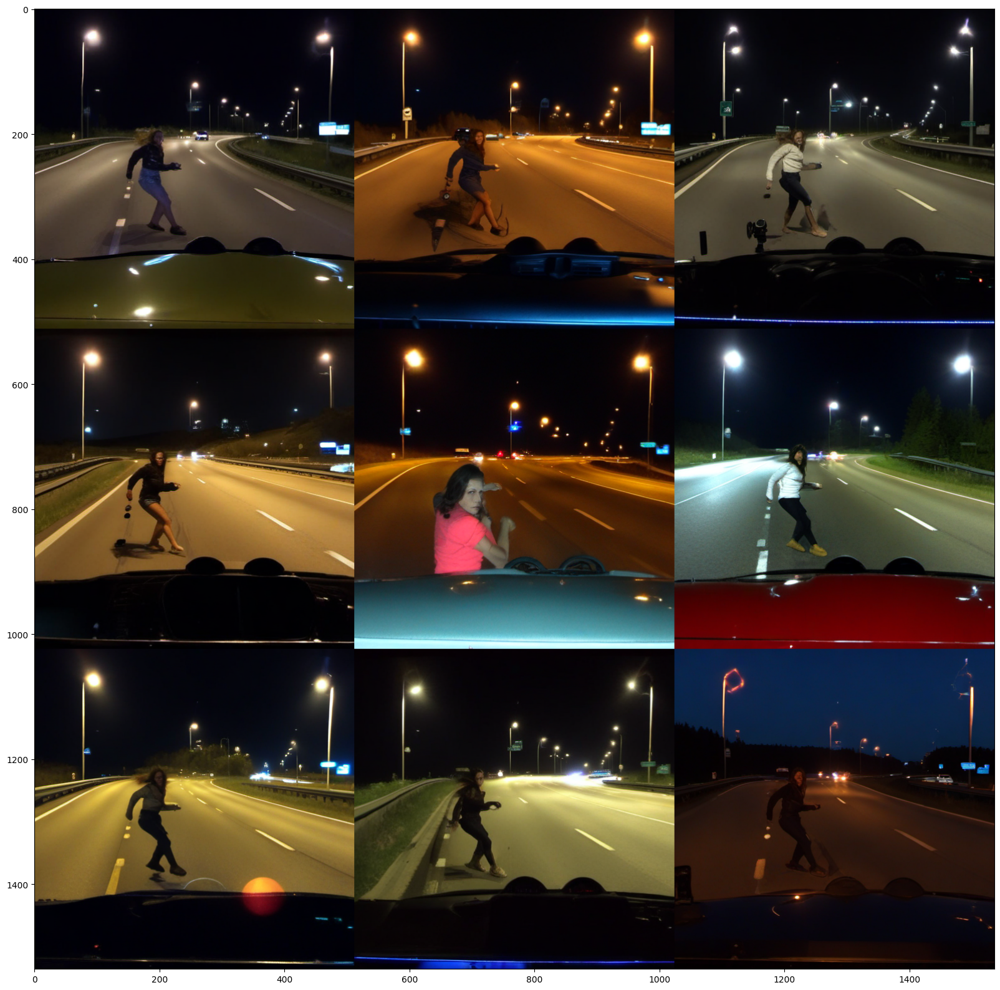

In [182]:
reload(cu)

samples, controls = cu.get_sdxl_sample(
    guidance=edges,
    ddim_steps=25,
    num_samples=9,
    model=model,
    seed=1456,
    shape=[4, size // 8, size // 8],
    control_scale=0.95,
    prompt="Dashcam image of a woman crossing a highway. Highly detailed, 4k image, sharp image, professional photograph, rural, dashcam, night time, dark",
    n_prompt='low quality, cartoon, animation, plastic, cgi, blurry, drawing, render, art, motion blur, depth of field, crosswalk, facade, shop',
)
plt.figure(figsize=(20, 20))
plt.imshow(cu.create_image_grid(samples))
plt.show()


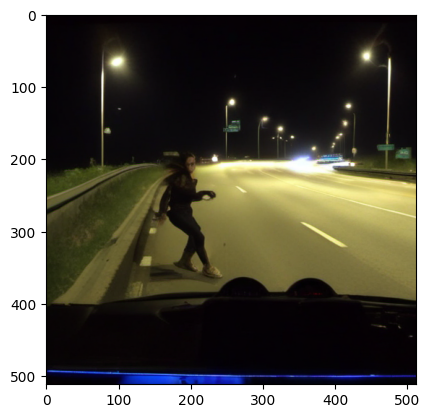

In [183]:
sampe_name = 'Generation_XL_edges_LORA_woman_3'
good = samples[7]


plt.imshow(good)
plt.show()

to_save = Image.fromarray(good)
to_save.save('/export/data/ffeiden/Kritische_Szenarien/Generations/'+sampe_name+'.png')